In [57]:
from rscovlm.utils import REFER

rrsisd_root = "../data/RRSIS-D"

# in this block, we process with REFER API
refer_api = REFER(rrsisd_root, "rrsisd", "unc")
all_ref_ids = sorted(refer_api.getRefIds())
ref_ids = sorted(refer_api.getRefIds(split='test'))
print(f"len(all_ref_ids)={len(all_ref_ids)}")
print(f"len(ref_ids)={len(ref_ids)}")

# changeRefBox
for annid in refer_api.Anns.keys():
    ann = refer_api.Anns[annid]
    x1, y1, x2, y2 = ann["bbox"]
    w = x2 - x1
    h = y2 - y1
    ann["bbox"] = [x1, y1, w, h]  # [x, y, w, h]

loading dataset rrsisd into memory...
ref_file:  ../data/RRSIS-D/rrsisd/refs(unc).p
creating index...
index created.
DONE (t=0.87s)
len(all_ref_ids)=17402
len(ref_ids)=3481


In [99]:
# in this block, we process with xml files
import os
import xmltodict
from tqdm import tqdm

def load_xml(xml_file):
    with open(xml_file, 'r') as f:
        return xmltodict.parse(f.read())
    
def load_objects_and_split_from_xml(xml_file):
    xml_dict = load_xml(xml_file)
    objects = xml_dict['annotation']['object']
    if not isinstance(objects, list):
        objects = [objects]
    return [obj for obj in objects if 'segmentation' in obj], xml_dict['annotation']['split']

xml_folder = os.path.join(rrsisd_root, 'images', 'rrsisd', 'ann_split')

In [59]:
# in this block, we compare the two annotations of the first training sample
from pprint import pprint
pprint(load_xml(os.path.join(xml_folder, f"{all_ref_ids[0]:05d}.xml")))
pprint(refer_api.Refs[all_ref_ids[0]])

{'annotation': {'filename': '00001.jpg',
                'object': {'area': '32165125',
                           'bndbox': {'xmax': '684',
                                      'xmin': '133',
                                      'ymax': '672',
                                      'ymin': '237'},
                           'description': 'A green and brown golf field',
                           'id': '93795049',
                           'iscrowd': '1',
                           'name': 'golffield',
                           'pose': 'Unspecified',
                           'segmentation': "{'size': [800, 800], 'counts': "
                                           "'WeZ31;0H1Th0OgXO0X_50lWK0TXO77Ieg00lXO0Wg02^1N^S30PSL030[_10]YO0cYO1oU2OUjM0hc00X\\\\O0fn20Wk00_lL0Ri00lVO0YZO0bT20SaN0Tb10P^N0[ZO0e^10aSO0f]O0ie00be00kdN0V[10_ZO0Xe10VPO0odN0Tb00go00\\\\W20mL0hdN0dSO0Ti00\\\\ZN0QP10moN0S^O0oZ10UeN0Ve00iL0j]O0iL020hd00o^O0Va00h^O0oY10TfN0oY10Vj10SaM0QS60jSI0im00Sd00SRO0RA0nJ0S10mN00

In [60]:
# in this block, we compare the two annotations of the first test sample
from pprint import pprint
pprint(load_xml(os.path.join(xml_folder, f"{ref_ids[0]:05d}.xml")))
pprint(refer_api.Refs[ref_ids[0]])

dior_rsvg_ann_root = "../data/DIOR-RSVG/Annotations"
pprint(load_xml(os.path.join(dior_rsvg_ann_root, f"{ref_ids[0]:05d}.xml")))

print(refer_api.getAnnIds(image_ids=ref_ids[0]))
pprint(refer_api.loadRefs(refer_api.getAnnIds(image_ids=ref_ids[0]))[0])

{'annotation': {'filename': '00005.jpg',
                'object': [{'bndbox': {'xmax': '500',
                                       'xmin': '376',
                                       'ymax': '434',
                                       'ymin': '324'},
                            'description': 'A white storage tank in the middle',
                            'id': '257932701',
                            'name': 'storagetank',
                            'pose': 'Unspecified'},
                           {'area': '157120',
                            'bndbox': {'xmax': '32',
                                       'xmin': '1',
                                       'ymax': '695',
                                       'ymin': '679'},
                            'description': 'The vehicle is on the lower left '
                                           'of the small rounded storage tank '
                                           'in the middle',
                            'id'

In [61]:
for refid in refer_api.Refs.keys():
    ref = refer_api.Refs[refid]
    if len(ref['sentences']) > 1:
        print(refid)
    sentence = ref['sentences'][0]
    if not sentence['raw'] == sentence['sent']:
        print(refid)
        print(sentence['raw'])
        print(sentence['sent'])

{'ann_id': 5,
 'category_id': 18,
 'file_name': '00005.jpg',
 'image_id': 5,
 'ref_id': 5,
 'sent_ids': [5],
 'sentences': [{'raw': 'The vehicle is on the lower left of the small rounded '
                       'storage tank in the middle',
                'sent': 'The vehicle is on the lower left of the small rounded '
                        'storage tank in the middle',
                'sent_id': 5,
                'tokens': ['The',
                           'vehicle',
                           'is',
                           'on',
                           'the',
                           'lower',
                           'left',
                           'of',
                           'the',
                           'small',
                           'rounded',
                           'storage',
                           'tank',
                           'in',
                           'the',
                           'middle']}],
 'split': 'test'}
The label i

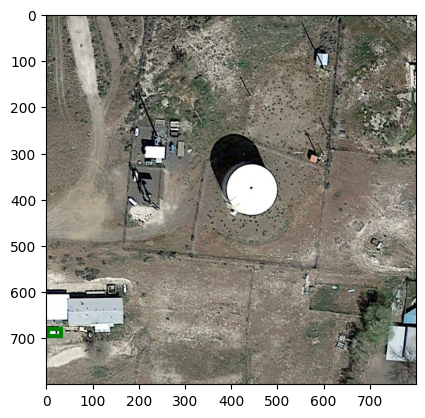

1. The vehicle is on the lower left of the small rounded storage tank in the middle


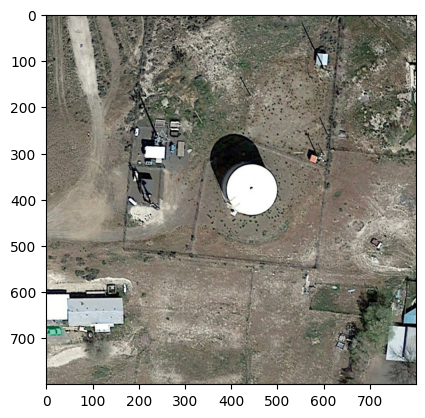

In [62]:
from pprint import pprint
import matplotlib.pyplot as plt

def show_ref(ref_id):
    ref = refer_api.loadRefs(ref_id)[0]
    pprint(ref)
    print("The label is %s." % refer_api.Cats[ref["category_id"]])
    plt.figure()
    print(f"The refer box is {refer_api.getRefBox(ref_id)}")
    refer_api.showRef(ref, seg_box="box")
    plt.show()
    plt.close()

    plt.figure()
    refer_api.showRef(ref, seg_box="seg")
    plt.show()
    plt.close()

show_ref(ref_ids[0])

{'ann_id': 15,
 'category_id': 18,
 'file_name': '00015.jpg',
 'image_id': 15,
 'ref_id': 15,
 'sent_ids': [15],
 'sentences': [{'raw': 'The vehicle is on the left of the airplane above',
                'sent': 'The vehicle is on the left of the airplane above',
                'sent_id': 15,
                'tokens': ['The',
                           'vehicle',
                           'is',
                           'on',
                           'the',
                           'left',
                           'of',
                           'the',
                           'airplane',
                           'above']}],
 'split': 'test'}
The label is vehicle.
The refer box is [338, 210, 16, 33]
1. The vehicle is on the left of the airplane above


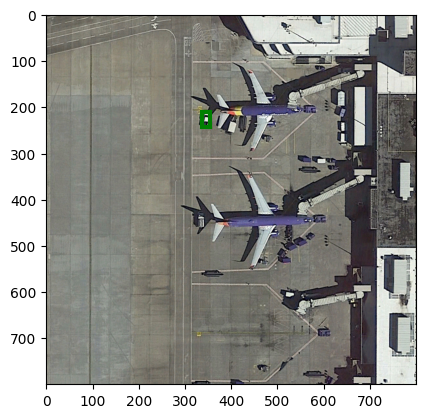

1. The vehicle is on the left of the airplane above


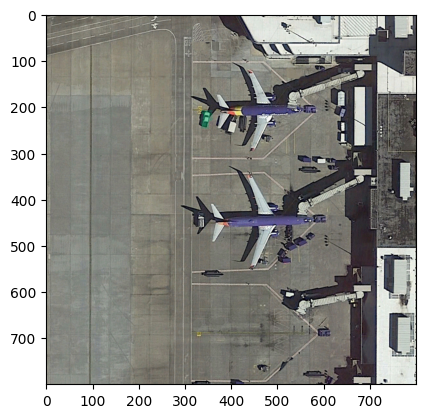

In [63]:
show_ref(ref_ids[1])

{'ann_id': 17,
 'category_id': 10,
 'file_name': '00017.jpg',
 'image_id': 17,
 'ref_id': 17,
 'sent_ids': [17],
 'sentences': [{'raw': 'The oval large green and red ground track field',
                'sent': 'The oval large green and red ground track field',
                'sent_id': 17,
                'tokens': ['The',
                           'oval',
                           'large',
                           'green',
                           'and',
                           'red',
                           'ground',
                           'track',
                           'field']}],
 'split': 'test'}
The label is groundtrackfield.
The refer box is [172, 95, 393, 620]
1. The oval large green and red ground track field


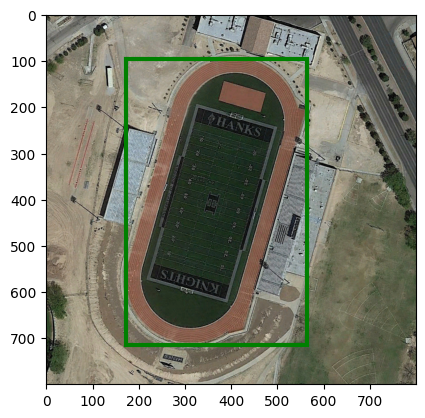

1. The oval large green and red ground track field


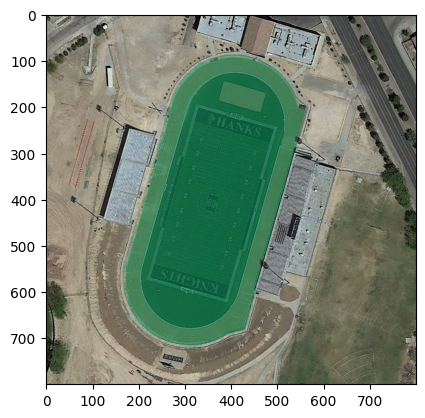

In [64]:
show_ref(ref_ids[2])

{'ann_id': 18,
 'category_id': 14,
 'file_name': '00018.jpg',
 'image_id': 18,
 'ref_id': 18,
 'sent_ids': [18],
 'sentences': [{'raw': 'A gray stadium in the middle',
                'sent': 'A gray stadium in the middle',
                'sent_id': 18,
                'tokens': ['A', 'gray', 'stadium', 'in', 'the', 'middle']}],
 'split': 'test'}
The label is stadium.
The refer box is [155, 59, 482, 617]
1. A gray stadium in the middle


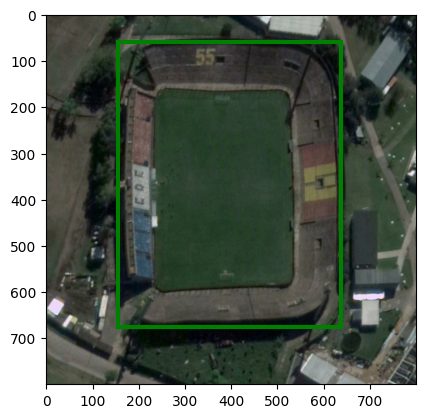

1. A gray stadium in the middle


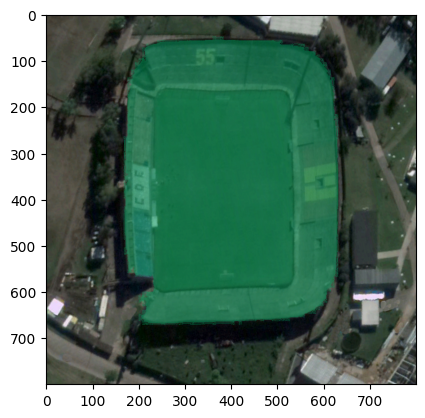

In [65]:
show_ref(ref_ids[3])

{'ann_id': 23,
 'category_id': 10,
 'file_name': '00023.jpg',
 'image_id': 23,
 'ref_id': 23,
 'sent_ids': [23],
 'sentences': [{'raw': 'A ground track field is above the airport in the '
                       'middle',
                'sent': 'A ground track field is above the airport in the '
                        'middle',
                'sent_id': 23,
                'tokens': ['A',
                           'ground',
                           'track',
                           'field',
                           'is',
                           'above',
                           'the',
                           'airport',
                           'in',
                           'the',
                           'middle']}],
 'split': 'test'}
The label is groundtrackfield.
The refer box is [480, 308, 49, 27]
1. A ground track field is above the airport in the middle


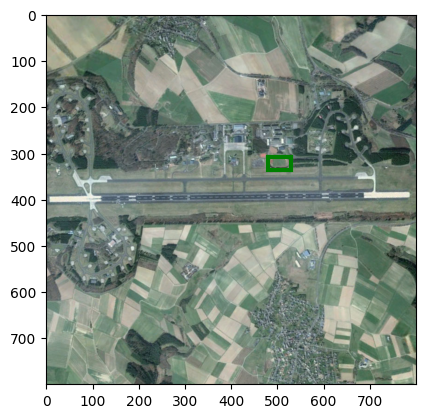

1. A ground track field is above the airport in the middle


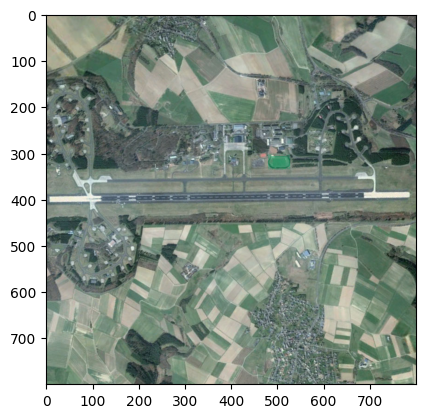

In [66]:
show_ref(ref_ids[4])

{'ann_id': 24,
 'category_id': 10,
 'file_name': '00024.jpg',
 'image_id': 24,
 'ref_id': 24,
 'sent_ids': [24],
 'sentences': [{'raw': 'The ground track field is in the red and gray stadium',
                'sent': 'The ground track field is in the red and gray stadium',
                'sent_id': 24,
                'tokens': ['The',
                           'ground',
                           'track',
                           'field',
                           'is',
                           'in',
                           'the',
                           'red',
                           'and',
                           'gray',
                           'stadium']}],
 'split': 'test'}
The label is groundtrackfield.
The refer box is [231, 186, 239, 452]
1. The ground track field is in the red and gray stadium


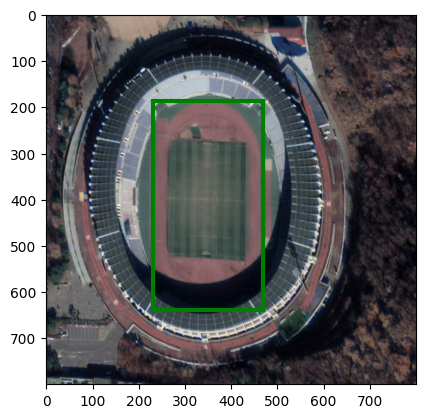

1. The ground track field is in the red and gray stadium


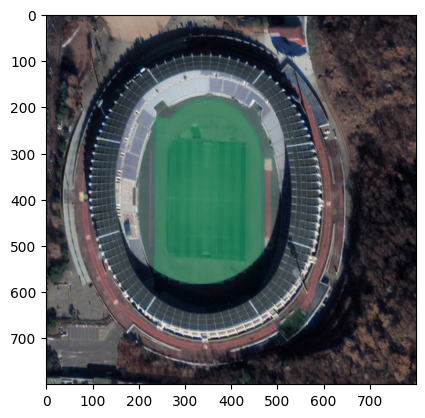

In [67]:
show_ref(ref_ids[5])

{'ann_id': 27,
 'category_id': 15,
 'file_name': '00027.jpg',
 'image_id': 27,
 'ref_id': 27,
 'sent_ids': [27],
 'sentences': [{'raw': 'A large storage tank in the middle',
                'sent': 'A large storage tank in the middle',
                'sent_id': 27,
                'tokens': ['A',
                           'large',
                           'storage',
                           'tank',
                           'in',
                           'the',
                           'middle']}],
 'split': 'test'}
The label is storagetank.
The refer box is [309, 306, 267, 258]
1. A large storage tank in the middle


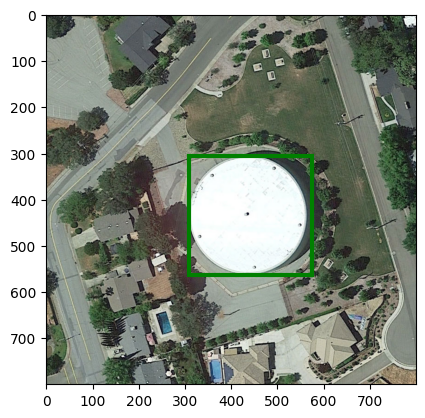

1. A large storage tank in the middle


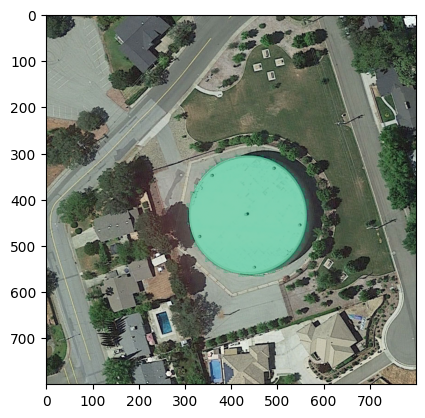

In [68]:
show_ref(ref_ids[6])

{'ann_id': 29,
 'category_id': 2,
 'file_name': '00029.jpg',
 'image_id': 29,
 'ref_id': 29,
 'sent_ids': [29],
 'sentences': [{'raw': 'A airplane at the bottom',
                'sent': 'A airplane at the bottom',
                'sent_id': 29,
                'tokens': ['A', 'airplane', 'at', 'the', 'bottom']}],
 'split': 'test'}
The label is airplane.
The refer box is [158, 457, 393, 326]
1. A airplane at the bottom


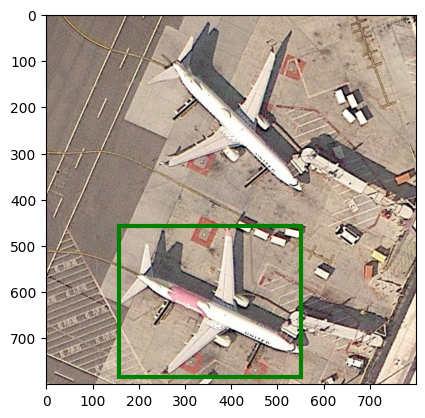

1. A airplane at the bottom


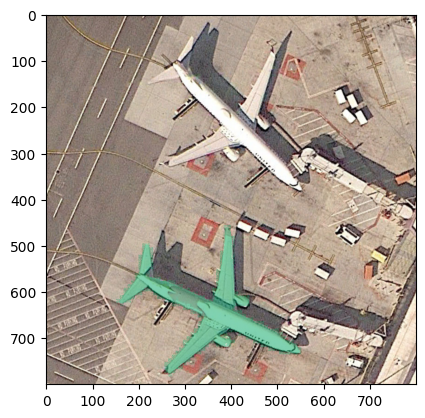

In [69]:
show_ref(ref_ids[7])

{'ann_id': 34,
 'category_id': 18,
 'file_name': '00034.jpg',
 'image_id': 34,
 'ref_id': 34,
 'sent_ids': [34],
 'sentences': [{'raw': 'The gray and black vehicle on the upper left',
                'sent': 'The gray and black vehicle on the upper left',
                'sent_id': 34,
                'tokens': ['The',
                           'gray',
                           'and',
                           'black',
                           'vehicle',
                           'on',
                           'the',
                           'upper',
                           'left']}],
 'split': 'test'}
The label is vehicle.
The refer box is [1, 34, 12, 38]
1. The gray and black vehicle on the upper left


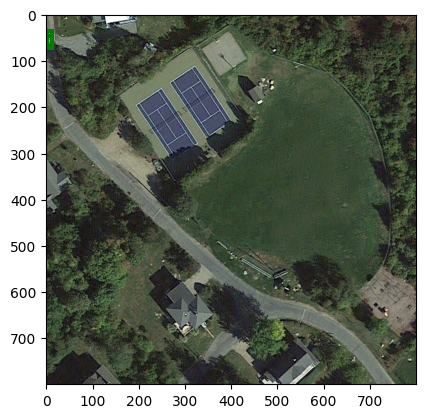

1. The gray and black vehicle on the upper left


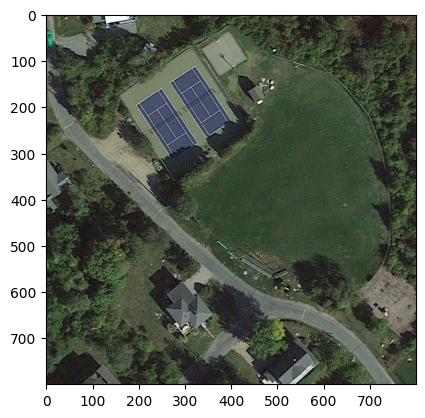

In [70]:
show_ref(ref_ids[8])

{'ann_id': 42,
 'category_id': 9,
 'file_name': '00042.jpg',
 'image_id': 42,
 'ref_id': 42,
 'sent_ids': [42],
 'sentences': [{'raw': 'A green golf field',
                'sent': 'A green golf field',
                'sent_id': 42,
                'tokens': ['A', 'green', 'golf', 'field']}],
 'split': 'test'}
The label is golffield.
The refer box is [79, 141, 697, 517]
1. A green golf field


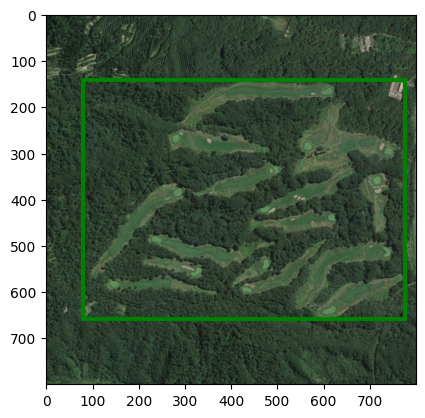

1. A green golf field


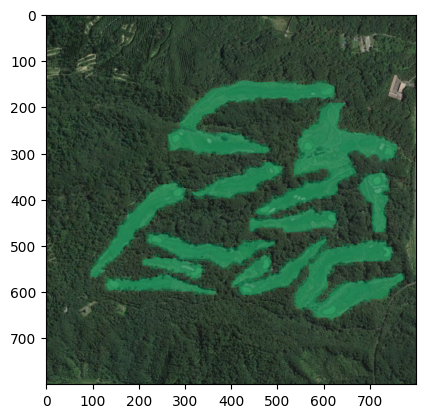

In [71]:
show_ref(ref_ids[9])

{'ann_id': 48,
 'category_id': 13,
 'file_name': '00048.jpg',
 'image_id': 48,
 'ref_id': 48,
 'sent_ids': [48],
 'sentences': [{'raw': 'A large ship in the middle',
                'sent': 'A large ship in the middle',
                'sent_id': 48,
                'tokens': ['A', 'large', 'ship', 'in', 'the', 'middle']}],
 'split': 'test'}
The label is ship.
The refer box is [281, 55, 374, 478]
1. A large ship in the middle


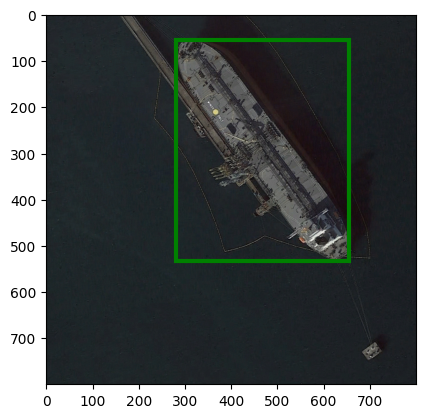

1. A large ship in the middle


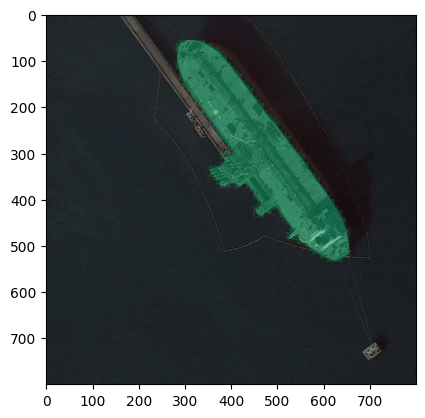

In [72]:
show_ref(ref_ids[10])

{'ann_id': 69,
 'category_id': 3,
 'file_name': '00069.jpg',
 'image_id': 69,
 'ref_id': 69,
 'sent_ids': [69],
 'sentences': [{'raw': 'The gray airport in the middle',
                'sent': 'The gray airport in the middle',
                'sent_id': 69,
                'tokens': ['The', 'gray', 'airport', 'in', 'the', 'middle']}],
 'split': 'test'}
The label is airport.
The refer box is [284, 285, 411, 420]
1. The gray airport in the middle


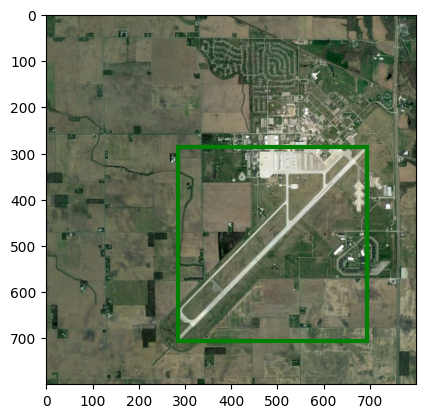

1. The gray airport in the middle


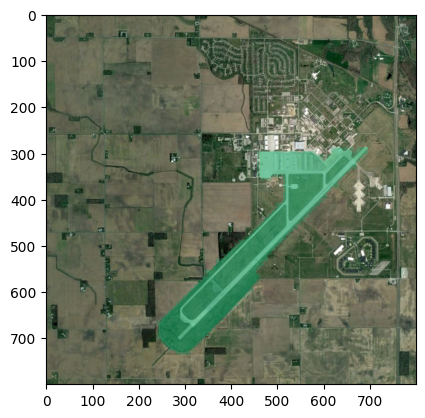

In [73]:
show_ref(ref_ids[16])

len(masks)=1
mask refer: (800, 800) area: 41363
mask xml: (800, 800) area: 58177


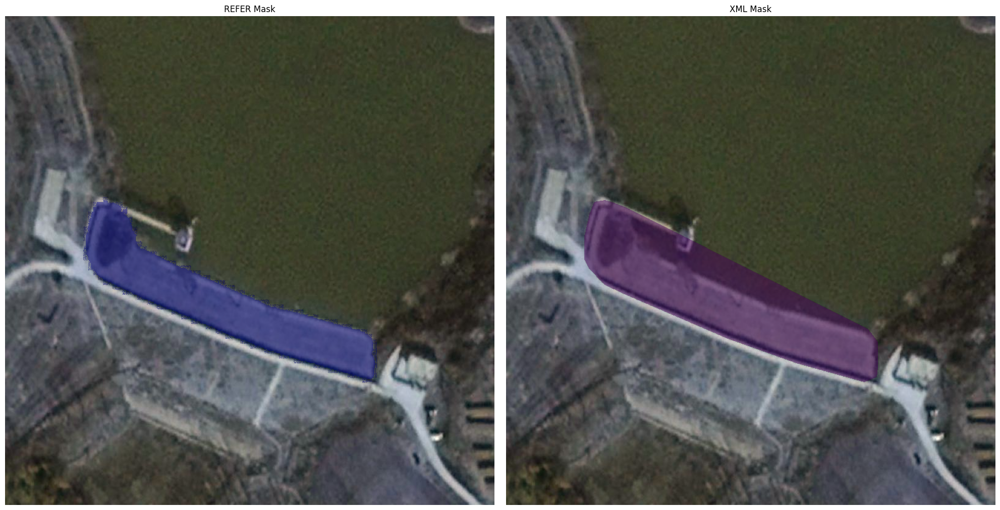

In [98]:
import cv2
import numpy as np
import xml.etree.ElementTree as ET
from pycocotools import mask as maskUtils

def rle_to_polygons(rle):
    binary_mask = maskUtils.decode(rle)
    contours, _ = cv2.findContours(binary_mask.astype(np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    if len(contours) == 0:
        return []
    
    all_contours = np.vstack(contours)
    hull = cv2.convexHull(all_contours)
    polygons = hull.flatten().tolist() if len(hull) >= 3 else []
    return [polygons]

def xml_to_masks(xml_path):
    tree = ET.parse(xml_path)
    root = tree.getroot()

    masks = []
    objects = root.findall('object')
    for obj in objects:
        if obj.find('segmentation') is not None:
            rle = eval(obj.find('segmentation').text)
            polygons = rle_to_polygons(rle)

            polygon_array = np.array(polygons).reshape(-1, 2).astype(int)
            polygon_array = np.append(polygon_array, polygon_array[0])
            polygon_array = polygon_array.reshape((-1, 2))

            mask = np.zeros((800, 800), dtype=np.uint8)
            cv2.fillPoly(mask, [polygon_array], color=255)
            masks.append((mask > 0).astype(np.uint8))

    print(f"len(masks)={len(masks)}")
    return masks

def draw_all(image, refer_mask, xml_mask):
    import matplotlib.pyplot as plt
    import matplotlib.patches as patches

    fig, axs = plt.subplots(1, 2, figsize=(20, 10))

    axs[0].imshow(image)
    refer_mask = np.ma.masked_where(refer_mask == 0, refer_mask)
    axs[0].imshow(refer_mask, cmap='jet', alpha=0.5)
    axs[0].set_title('REFER Mask')
    axs[0].axis('off')

    axs[1].imshow(image)
    xml_mask = np.ma.masked_where(xml_mask == 0, xml_mask)
    axs[1].imshow(xml_mask, cmap='viridis', alpha=0.5)
    axs[1].set_title('XML Mask')
    axs[1].axis('off')

    plt.tight_layout()
    plt.show()
    plt.close()

# INDEX = 16
INDEX = 19

mask_refer = maskUtils.decode(refer_api.refToAnn[ref_ids[INDEX]]['segmentation'][0])
mask_xml = xml_to_masks(os.path.join(xml_folder, f"{ref_ids[INDEX]:05d}.xml"))[0]
print(f"mask refer: {mask_refer.shape} area: {mask_refer.sum()}")
print(f"mask xml: {mask_xml.shape} area: {mask_xml.sum()}")
image = cv2.imread(os.path.join(rrsisd_root, 'images', 'rrsisd', 'JPEGImages', f"{ref_ids[INDEX]:05d}.jpg"))
draw_all(image, mask_refer, mask_xml)

refer相比xml，train/val/test 分别少了多少呢

In [100]:
print("REFER | XML stastistics")

xml_num = {'train': 0, 'val': 0, 'test': 0}
for xml_fname in tqdm(os.listdir(xml_folder)):
    if xml_fname.endswith(".xml"):
        xml_path = os.path.join(xml_folder, xml_fname)
        objects, split = load_objects_and_split_from_xml(xml_path)
        xml_num[split] += len(objects)
        
print(f"train: {len(refer_api.getRefIds(split='train'))} | {xml_num['train']}")
print(f"val: {len(refer_api.getRefIds(split='val'))} | {xml_num['val']}")
print(f"test: {len(refer_api.getRefIds(split='test'))} | {xml_num['test']}")

REFER | XML stastistics
train: 12181 | 12181
val: 1740 | 1740
test: 3481 | 3481
